In [45]:
import mne 
import itertools
import os
from mne import read_epochs
from mne.time_frequency import psd_welch
from mne.viz import plot_topomap
import matplotlib.pyplot as plt
import pandas as pd
from fooof import FOOOF
from fooof import FOOOFGroup
import numpy as np
import scipy.stats
import json
import collections
import pprint

In [46]:
#single subject analysis Coherence, motor epochs 

In [49]:
cats=['zero','low','med','high']
cat_params=[]
for cat in cats:
    session_params=[]
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-beh.csv' % session)
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-motor-epo.fif' % session)
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[df['coh_cat'] ==  cat].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        exp = fg.get_params('aperiodic_params', 'exponent')
        session_params.append(exp)
    cat_params.append(session_params)
cat_params=np.array(cat_params)

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\s

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\s

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\s

In [51]:
cat_params_mean=np.mean(cat_params,axis=1)
zero=(cat_params_mean[0])
low=(cat_params_mean[1])
med=(cat_params_mean[2])
high=(cat_params_mean[3])
l_z=np.subtract(low,zero)
m_z=np.subtract(med,zero)
h_z=np.subtract(high,zero)
V=np.concatenate((l_z,m_z,h_z))

Text(0.5, 1.0, 'slope')

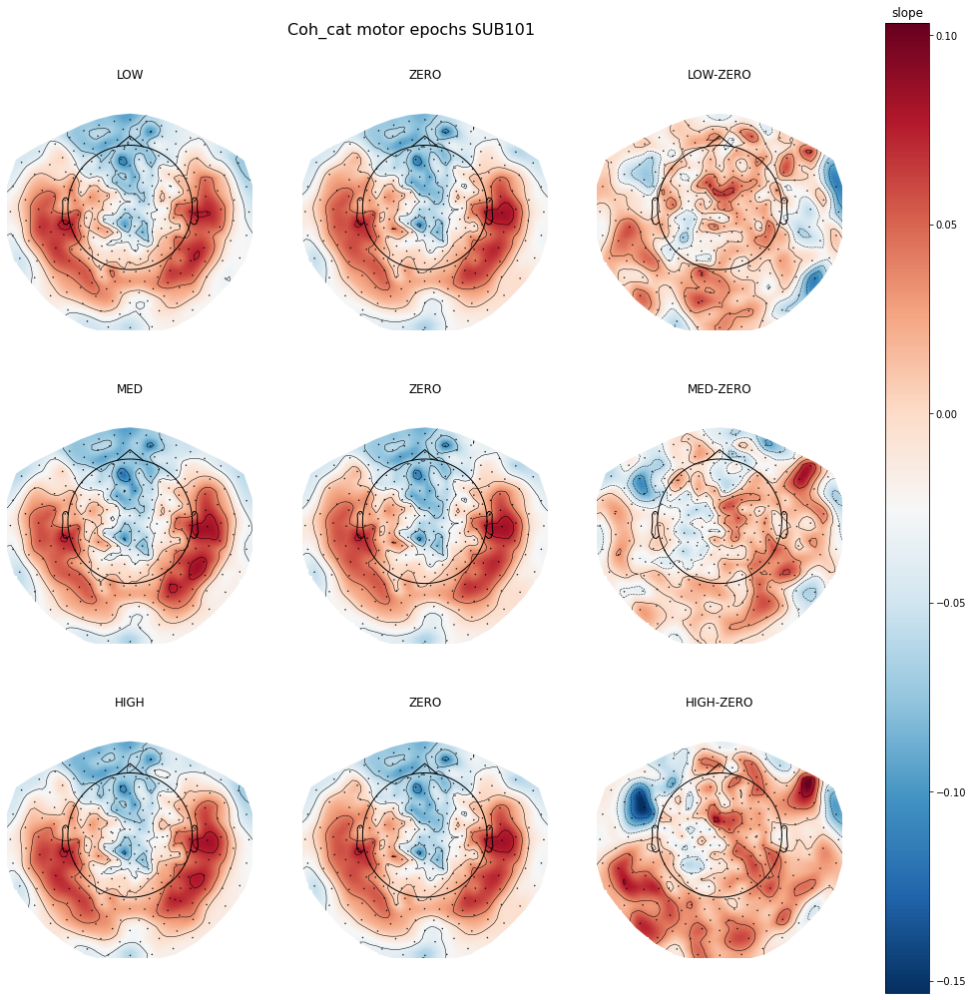

In [52]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6],[ax7,ax8,ax9]]= plt.subplots (3,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)

fig.suptitle('Coh_cat motor epochs SUB101',fontsize=16,y=1)

im,cm=plot_topomap(low, epochs.info ,cmap="RdBu_r", show=False, axes=ax1, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax1.set(title="LOW")

im,cm=plot_topomap(zero, epochs.info, cmap="RdBu_r", show=False, axes=ax2, vmax=np.max(cat_params), vmin=np.min(cat_params))             
ax2.set(title="ZERO")
             
im,cm=plot_topomap(l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="LOW-ZERO")

im,cm=plot_topomap(med, epochs.info ,cmap="RdBu_r", show=False, axes=ax4, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax4.set(title="MED")  

im,cm=plot_topomap(zero, epochs.info, cmap="RdBu_r", show=False, axes=ax5, vmax=np.max(cat_params), vmin=np.min(cat_params))                      
ax5.set(title="ZERO")
             
im,cm=plot_topomap(m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="MED-ZERO")


im,cm=plot_topomap(high, epochs.info ,cmap="RdBu_r", show=False, axes=ax7, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax7.set(title="HIGH")             

im,cm=plot_topomap(zero, epochs.info, cmap="RdBu_r", show=False, axes=ax8, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax8.set(title="ZERO")
             
im,cm=plot_topomap(h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax9,vmax=np.max(V),vmin=np.min(V))
ax9.set(title="HIGH-ZERO")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [3]:
#single subject analysis Coherence, visual epochs 

In [49]:
cats=['zero','low','med','high']
cat_params=[]
for cat in cats:
    session_params=[]
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-beh.csv' % session)
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-visual-epo.fif' % session)
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[df['coh_cat'] ==  cat].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        exp = fg.get_params('aperiodic_params', 'exponent')
        session_params.append(exp)
    cat_params.append(session_params)
cat_params=np.array(cat_params)

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\

KeyboardInterrupt: 

In [42]:
cat_params_meanV=np.mean(cat_params,axis=0)
Vzero=(cat_params_meanV[0])
Vlow=(cat_params_meanV[1])
Vmed=(cat_params_meanV[2])
Vhigh=(cat_params_meanV[3])
Vl_z=np.subtract(Vlow,Vzero)
Vm_z=np.subtract(Vmed,Vzero)
Vh_z=np.subtract(Vhigh,Vzero)
V=np.concatenate((Vl_z,Vm_z,Vh_z))

Text(0.5, 1.0, 'slope')

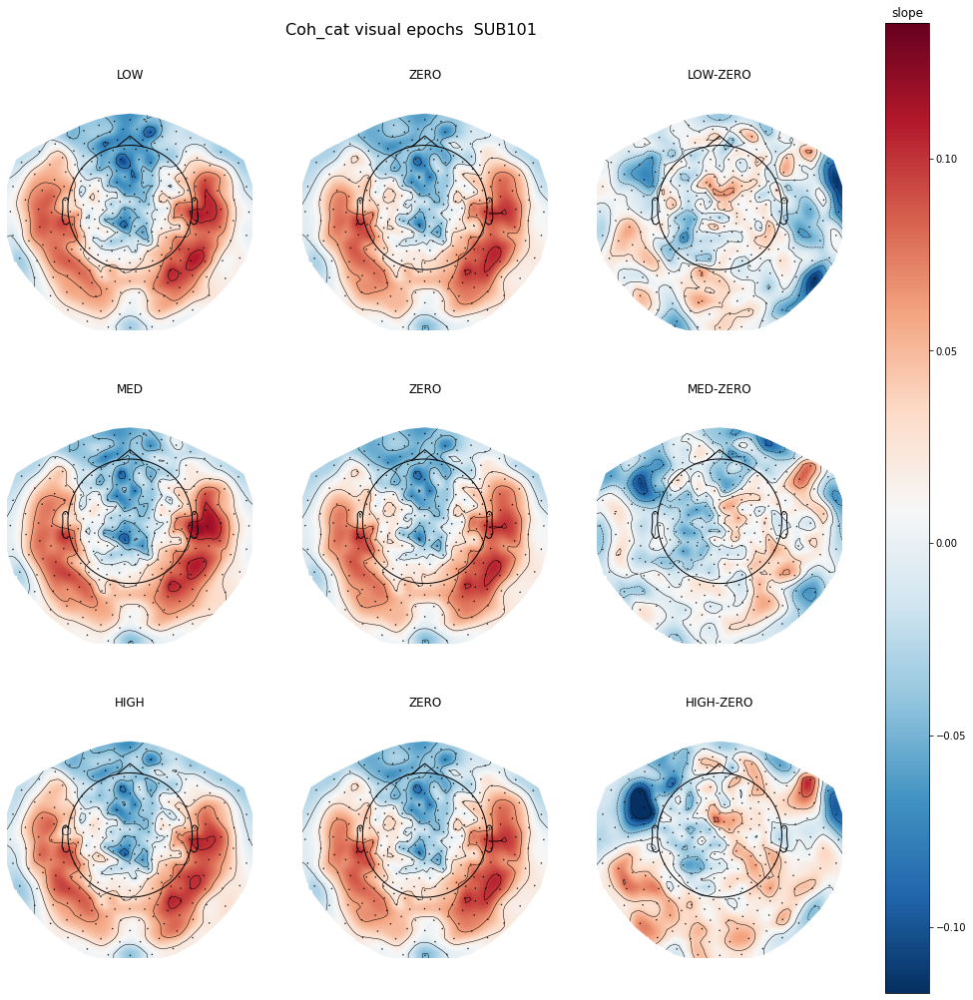

In [46]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6],[ax7,ax8,ax9]]= plt.subplots (3,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)


ax1.set(title="LOW")
fig.suptitle('Coh_cat visual epochs  SUB101',fontsize=16,y=1)
plot_topomap(Vlow, epochs.info ,cmap="RdBu_r", show=False, axes=ax1, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
plot_topomap(Vzero, epochs.info, cmap="RdBu_r", show=False, axes=ax2, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
ax2.set(title="ZERO")
             
im,cm =plot_topomap(l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="LOW-ZERO")

plot_topomap(Vmed, epochs.info ,cmap="RdBu_r", show=False, axes=ax4, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax4.set(title="MED")            
plot_topomap(Vzero, epochs.info, cmap="RdBu_r", show=False, axes=ax5, vmax=np.max(cat_params), vmin=np.min(cat_params))
             

             
ax5.set(title="ZERO")
             
im,cm =plot_topomap(m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="MED-ZERO")


plot_topomap(Vhigh, epochs.info ,cmap="RdBu_r", show=False, axes=ax7, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax7.set(title="HIGH")             
plot_topomap(Vzero, epochs.info, cmap="RdBu_r", show=False, axes=ax8, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
ax8.set(title="ZERO")
             
im,cm =plot_topomap(h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax9,vmax=np.max(V),vmin=np.min(V))
ax9.set(title="HIGH-ZERO")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [ ]:
#single subject analysis perturbation, motor epochs 

In [47]:
Perturbs = {-30.0,00.0,+30.0}
cat_params = []
for perturb in Perturbs:
    session_params=[]
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-beh.csv' % session)
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-motor-epo.fif' % session)
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[df['perturb_cat'] == perturb].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        exp = fg.get_params('aperiodic_params', 'exponent')
        session_params.append(exp)
    cat_params.append(session_params)
cat_params=np.array(cat_params)


Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\s

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\s

In [47]:
cat_params_mean=np.mean(cat_params,axis=1)
m30=(cat_params_mean[0])
pzero=(cat_params_mean[1])
p30=(cat_params_mean[2])
m30_zero=np.subtract(m30,pzero)
p30_zero=np.subtract(p30,pzero)

In [1]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots (2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)


ax1.set(title="MINUS 30")
fig.suptitle('Perturb_cat motor epochs SUB101',fontsize=16,y=1)
im,cm =plot_topomap(m30, epochs.info ,cmap="RdBu_r", show=False, axes=ax1, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
im,cm =plot_topomap(pzero, epochs.info, cmap="RdBu_r", show=False, axes=ax2, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
ax2.set(title="ZERO")
             
im,cm =plot_topomap(m30_zero,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(m30_zero),vmin=np.min(m30_zero))
ax3.set(title="MINUS 30-zero")

im,cm =plot_topomap(p30, epochs.info ,cmap="RdBu_r", show=False, axes=ax4, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax4.set(title="PLUS 30")            
im,cm =plot_topomap(pzero, epochs.info, cmap="RdBu_r", show=False, axes=ax5, vmax=np.max(cat_params), vmin=np.min(cat_params))
             

             
ax5.set(title="ZERO")
             
im,cm =plot_topomap(p30_zero, epochs.info, cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(p30_zero),vmin=np.min(p30_zero))
ax6.set(title="PLUS 30-ZERO")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.5
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

NameError: name 'plt' is not defined

In [ ]:
#single subject analysis perturbation, visual epochs 

In [54]:
Perturbs = {-30.0,00.0,+30.0}
cat_params = []
for perturb in Perturbs:
    session_params=[]
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-beh.csv' % session)
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-00%d-visual-epo.fif' % session)
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)

        idx=df[df['perturb_cat'] == perturb].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        exp = fg.get_params('aperiodic_params', 'exponent')
        session_params.append(exp)
    cat_params.append(session_params)
cat_params=np.array(cat_params)

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-004-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of


FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\sub-101\sub-101\sub-101-007-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF 

In [55]:
cat_params_mean=np.mean(cat_params,axis=1)
Vm30=(cat_params_mean[0])
Vpzero=(cat_params_mean[1])
Vp30=(cat_params_mean[2])

In [58]:
Vm30_zero=np.subtract(m30,Vpzero)
Vp30_zero=np.subtract(p30,Vpzero)
V=np.concatenate((Vm30_zero,Vp30_zero))

Text(0.5, 1.0, 'slope')

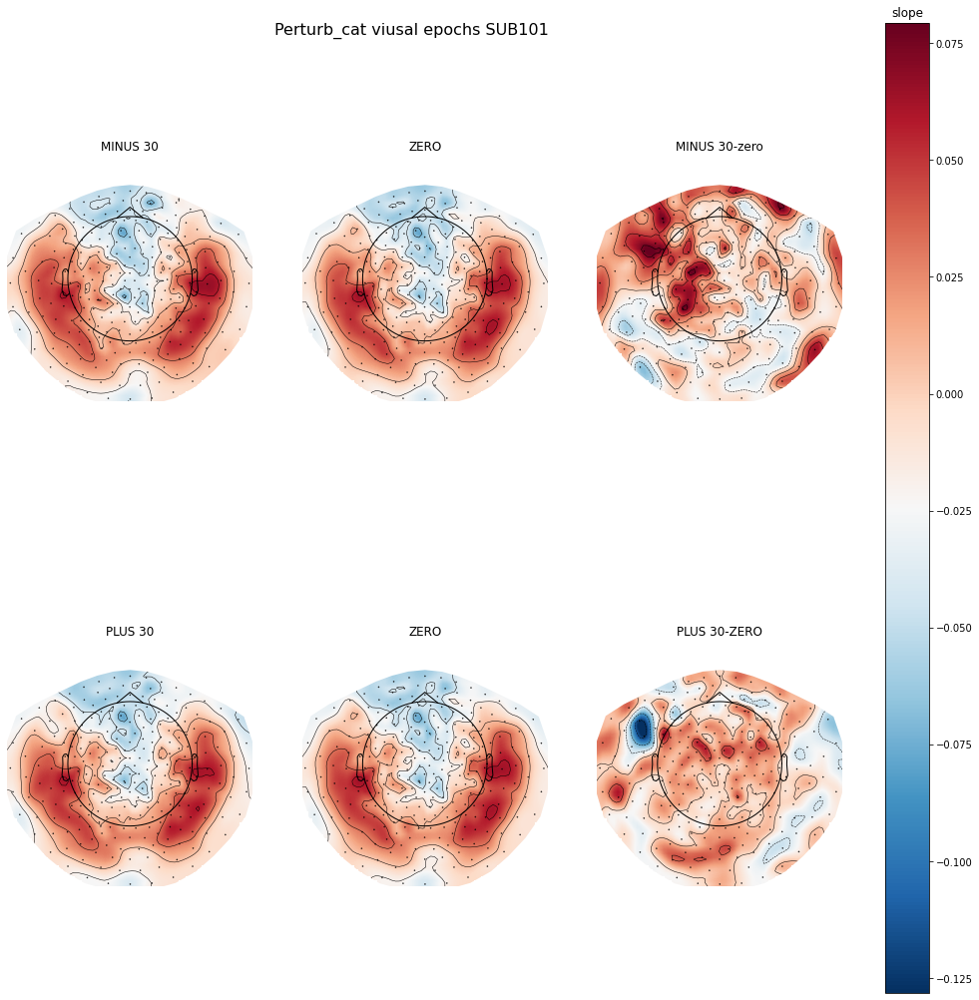

In [60]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots (2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)


ax1.set(title="MINUS 30")
fig.suptitle('Perturb_cat viusal epochs SUB101',fontsize=16,y=1)
im,cm =plot_topomap(Vm30, epochsV.info ,cmap="RdBu_r", show=False, axes=ax1, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
im,cm =plot_topomap(Vpzero, epochsV.info, cmap="RdBu_r", show=False, axes=ax2, vmax=np.max(cat_params), vmin=np.min(cat_params))
             
ax2.set(title="ZERO")
             
im,cm =plot_topomap(Vm30_zero,epochsV.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="MINUS 30-zero")

im,cm =plot_topomap(Vp30, epochsV.info ,cmap="RdBu_r", show=False, axes=ax4, vmax=np.max(cat_params), vmin=np.min(cat_params))
ax4.set(title="PLUS 30")            
im,cm =plot_topomap(Vpzero, epochsV.info, cmap="RdBu_r", show=False, axes=ax5, vmax=np.max(cat_params), vmin=np.min(cat_params))
             

             
ax5.set(title="ZERO")
             
im,cm =plot_topomap(Vp30_zero, epochsV.info, cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="PLUS 30-ZERO")
ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [4]:
#shape(catagories,runs(session),channels)
#multi subject analysis 
#the zeros are in seprate loop, for better computational efficiency 

In [86]:
motor_zero_inter=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        exp = fg.get_params('aperiodic_params', 'exponent')
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    motor_zero_inter.append(session_params)
motor_zero_inter=np.array(motor_zero_inter)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [87]:
motor_perturb_coh=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    motor_perturb_coh.append(perturb_list)
motor_perturb_coh=np.array(motor_perturb_coh)  

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [88]:
mpcmean=np.nanmean(motor_perturb_coh,axis=(0,3))
mpczmean=np.nanmean(motor_zero_inter,axis=(0,1))

In [89]:
M30low=mpcmean[0,0,:]
M30med=mpcmean[0,1,:]
M30high=mpcmean[0,2,:]
P30low=mpcmean[1,0,:]
P30med=mpcmean[1,1,:]
P30high=mpcmean[1,2,:]
Nm30l_z=np.subtract(M30low,mpczmean)                    
Nm30m_z=np.subtract(M30med,mpczmean)        
Nm30h_z=np.subtract(M30high,mpczmean)        
Np30l_z=np.subtract(P30low,mpczmean)
Np30m_z=np.subtract(P30med,mpczmean)       
Np30h_z=np.subtract(P30high,mpczmean)
V=np.concatenate((Nm30l_z,Nm30m_z,Nm30h_z,Np30l_z,Np30m_z,Np30h_z))

Text(0.5, 1.0, 'slope')

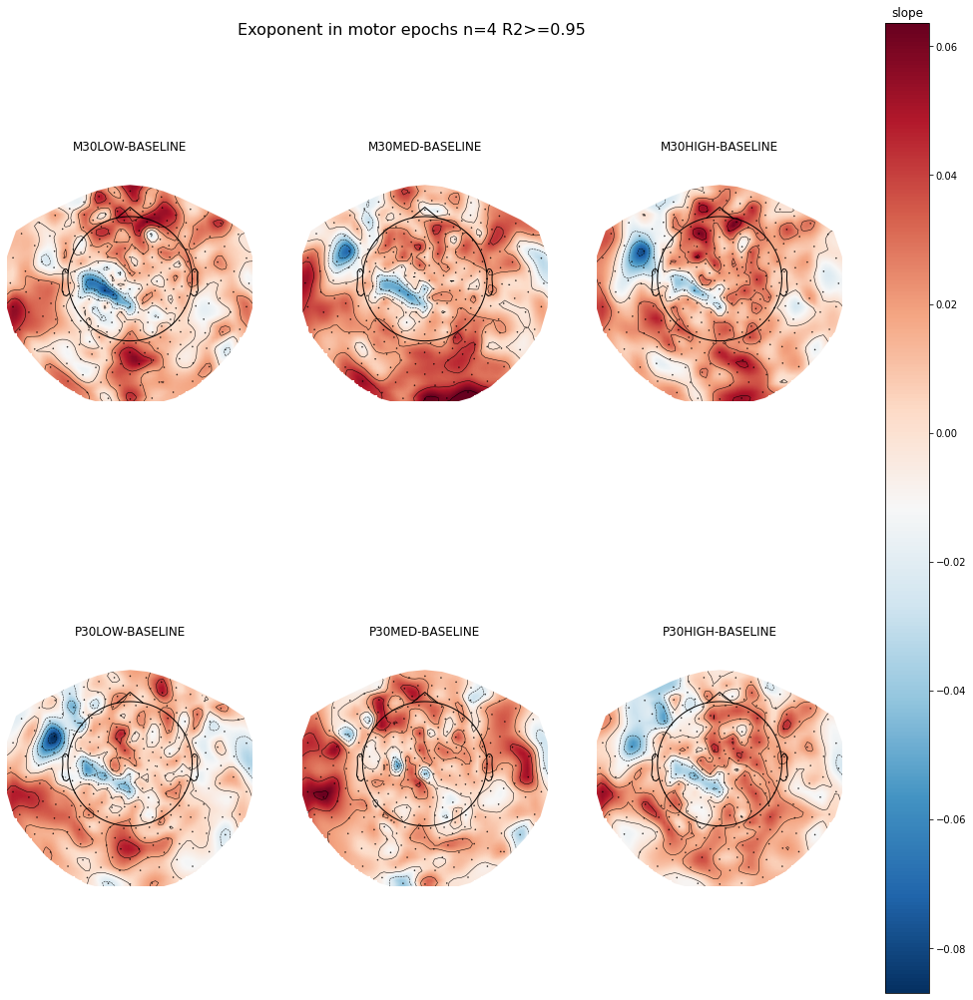

In [90]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Exoponent in motor epochs n=4 R2>=0.95',fontsize=16,y=1)

im,cm =plot_topomap(Nm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Nm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Nm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Np30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Np30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm =plot_topomap(Np30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [108]:
visual_zero_inter=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)
    visual_zero_inter.append(session_params)
visual_zero_inter=np.array(visual_zero_inter)




Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

In [58]:
visual_perturb_coh=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    visual_perturb_coh.append(perturb_list)
visual_perturb_coh=np.array(visual_perturb_coh)        


Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-007-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

KeyboardInterrupt: 

In [110]:
meanVPC=np.nanmean(visual_perturb_coh,axis=(0,3))
meanVPCZ=np.nanmean(visual_zero_inter,axis=(0,1))

In [111]:
M30low=meanVPC[0,0,:]
M30med=meanVPC[0,1,:]
M30high=meanVPC[0,2,:]
P30low=meanVPC[1,0,:]
P30med=meanVPC[1,1,:]
P30high=meanVPC[1,2,:]
Vm30l_z=np.subtract(M30low,meanVPCZ)                    
Vm30m_z=np.subtract(M30med,meanVPCZ)        
Vm30h_z=np.subtract(M30high,meanVPCZ)        
Vp30l_z=np.subtract(P30low,meanVPCZ)
Vp30m_z=np.subtract(P30med,meanVPCZ)       
Vp30h_z=np.subtract(P30high,meanVPCZ)
V=np.concatenate((Vm30l_z,Vm30m_z,Vm30h_z,Vp30l_z,Vp30m_z,Vp30h_z))


Text(0.5, 1.0, 'slope')

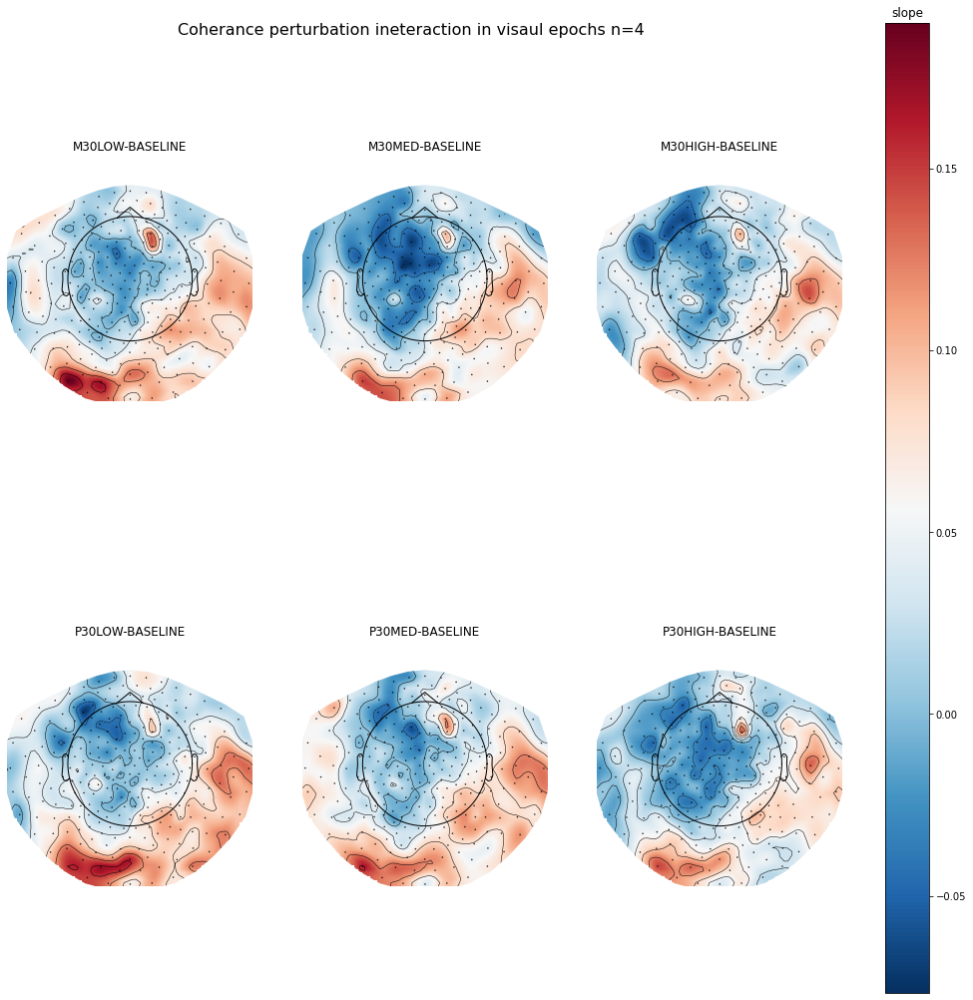

In [112]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Coherance perturbation ineteraction in visaul epochs n=4',fontsize=16,y=1)

im,cm =plot_topomap(Vm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Vm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Vm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Vp30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Vp30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

plot_topomap(Vp30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")
ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [5]:
#offset analysis 

In [42]:
visual_zero_inter_offset=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        off = fg.get_params('aperiodic_params', 'offset')
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        off=np.array(off)
        off[idxr2]=np.nan
        session_params.append(off)
    visual_zero_inter_offset.append(session_params)
visual_zero_inter_offset=np.array(visual_zero_inter_offset)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

In [ ]:
visual_perturb_coh_offset=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                off = fg.get_params('aperiodic_params', 'offset')
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                off=np.array(off)
                off[idxr2]=np.nan
                session_params.append(off)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    visual_perturb_coh_offset.append(perturb_list)
visual_perturb_coh_offset=np.array(visual_perturb_coh_offset)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

In [41]:
meanVPCO=np.nanmean(visual_perturb_coh_offset,axis=(0,3))
meanVPCZO=np.nanmean(visual_zero_inter_offset,axis=(0,1))

NameError: name 'visual_perturb_coh_offset' is not defined

In [97]:
M30low=meanVPCO[0,0,:]
M30med=meanVPCO[0,1,:]
M30high=meanVPCO[0,2,:]
P30low=meanVPCO[1,0,:]
P30med=meanVPCO[1,1,:]
P30high=meanVPCO[1,2,:]
VOm30l_z=np.subtract(M30low,meanVPCZO)                    
VOm30m_z=np.subtract(M30med,meanVPCZO)        
VOm30h_z=np.subtract(M30high,meanVPCZO)        
VOp30l_z=np.subtract(P30low,meanVPCZO)
VOp30m_z=np.subtract(P30med,meanVPCZO)       
VOp30h_z=np.subtract(P30high,meanVPCZO)
V=np.concatenate((VOm30l_z,VOm30m_z,VOm30h_z,VOp30l_z,VOp30m_z,VOp30h_z))

NameError: name 'VOm30l_z' is not defined

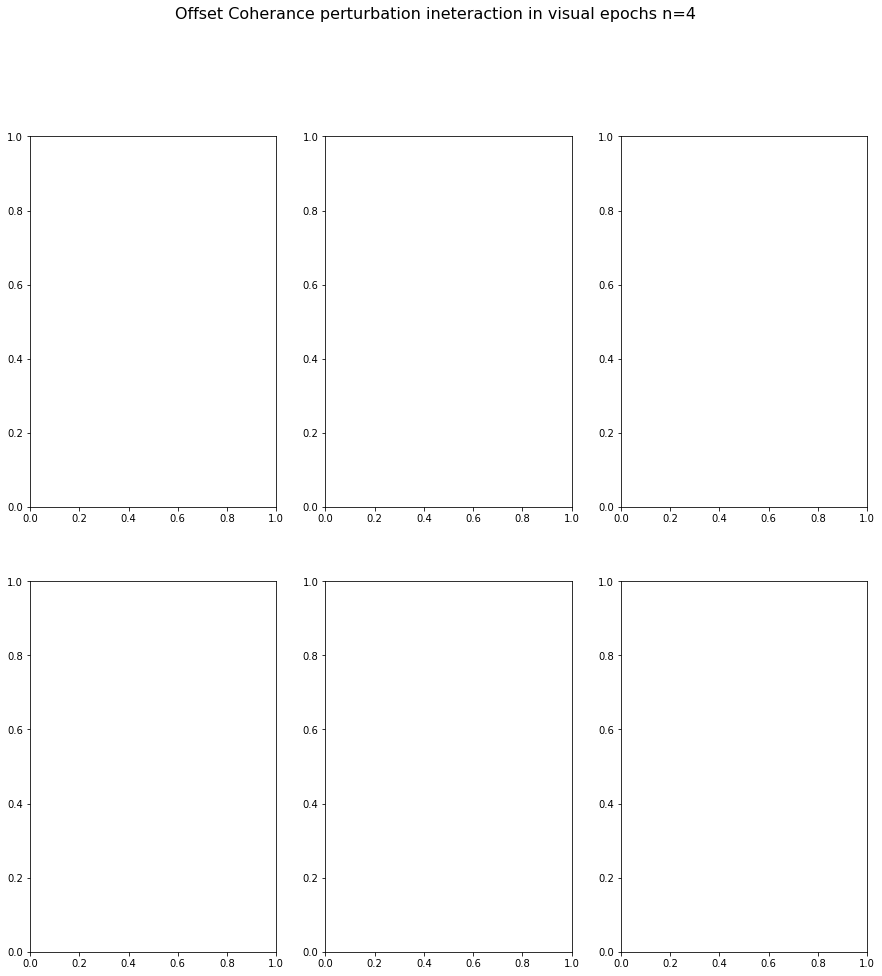

In [38]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Offset Coherance perturbation ineteraction in visual epochs n=4',fontsize=16,y=1)

im,cm=plot_topomap(VOm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm=plot_topomap(VOm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm=plot_topomap(VOm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm=plot_topomap(VOp30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm=plot_topomap(VOp30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm=plot_topomap(VOp30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('Offset')

In [101]:
motor_zero_inter_offset=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    motor_zero_inter_offset.append(session_params)
motor_zero_inter_offset=np.array(motor_zero_inter_offset)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [102]:
motor_perturb_coh_offset=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    motor_perturb_coh_offset.append(perturb_list)
motor_perturb_coh_offset=np.array(motor_perturb_coh_offset)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [103]:
meanMPCZO=np.nanmean(motor_zero_inter_offset,axis=(0,1))
meanMPCO=np.nanmean(motor_perturb_coh_offset,axis=(0,3))
M30low=meanMPCO[0,0,:]
M30med=meanMPCO[0,1,:]
M30high=meanMPCO[0,2,:]
P30low=meanMPCO[1,0,:]
P30med=meanMPCO[1,1,:]
P30high=meanMPCO[1,2,:]
MOm30l_z=np.subtract(M30low,meanMPCZO)                    
MOm30m_z=np.subtract(M30med,meanMPCZO)        
MOm30h_z=np.subtract(M30high,meanMPCZO)        
MOp30l_z=np.subtract(P30low,meanMPCZO)
MOp30m_z=np.subtract(P30med,meanMPCZO)       
MOp30h_z=np.subtract(P30high,meanMPCZO)
V=np.concatenate((MOm30l_z,MOm30m_z,MOm30h_z,MOp30l_z,MOp30m_z,MOp30h_z))

Text(0.5, 1.0, 'Offset')

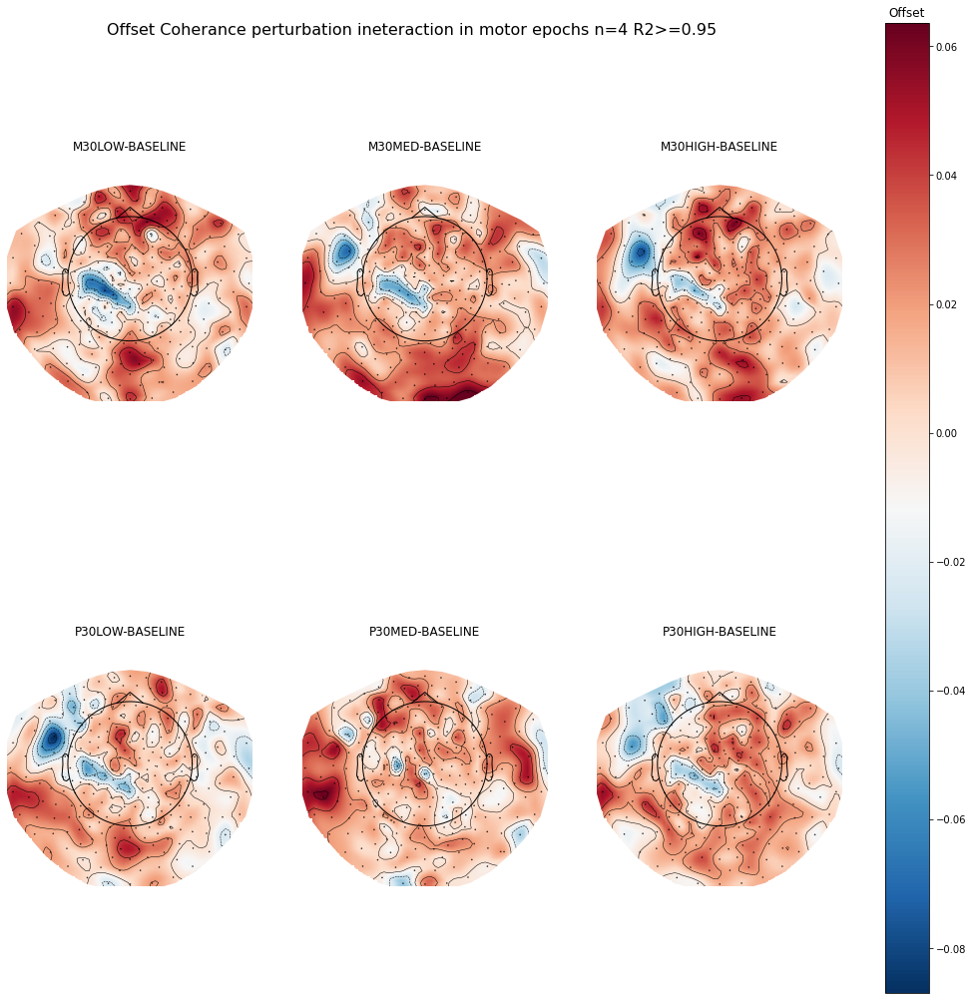

In [105]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Offset Coherance perturbation ineteraction in motor epochs n=4 R2>=0.95',fontsize=16,y=1)

im,cm=plot_topomap(MOm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm=plot_topomap(MOm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm=plot_topomap(MOm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm=plot_topomap(MOp30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm=plot_topomap(MOp30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm=plot_topomap(MOp30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('Offset')

In [6]:
#Goodness of fit plotting and saving

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-005-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-007-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-008-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-004-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-005-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-007-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-008-motor-epo.fif ...
    Read 5 compensation matrices


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-005-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-007-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-008-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-004-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-005-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\plts\fg.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=PLT_FIGSIZES['group'])
C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-008-motor-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


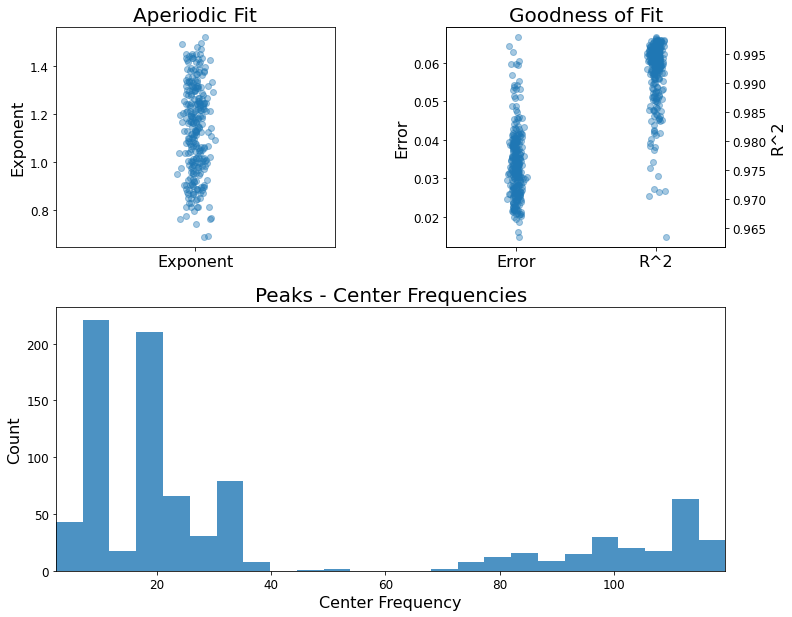

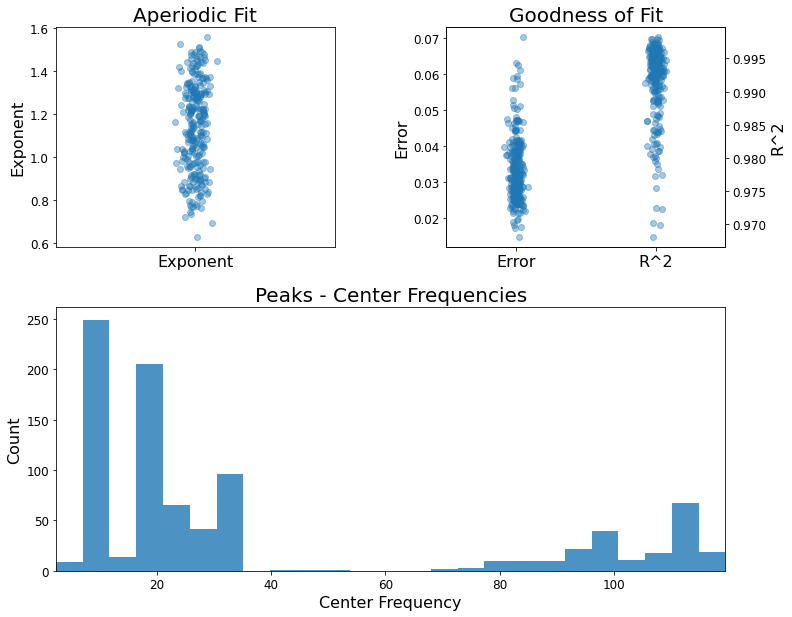

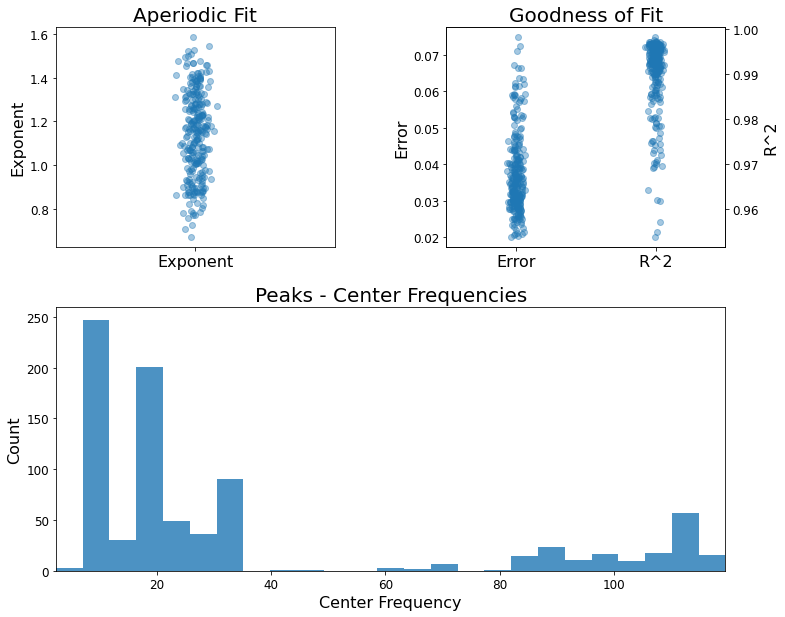

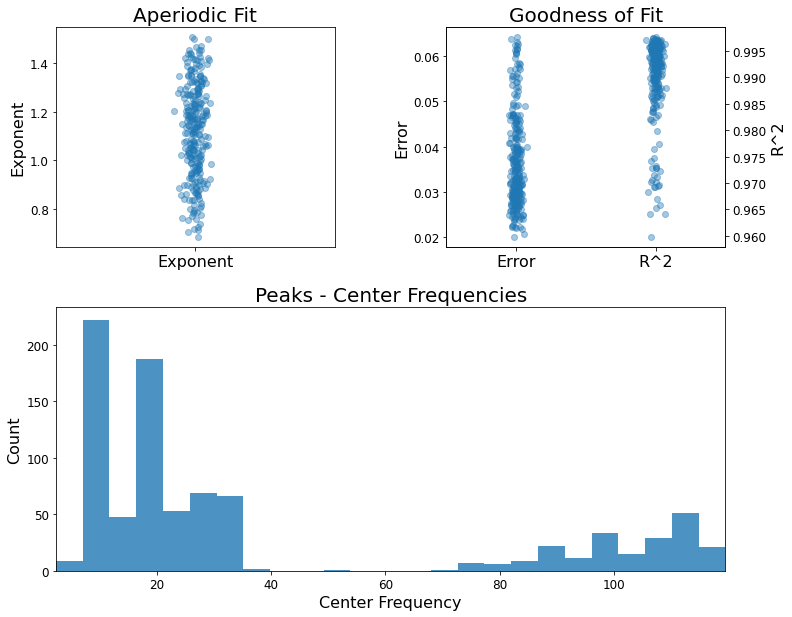

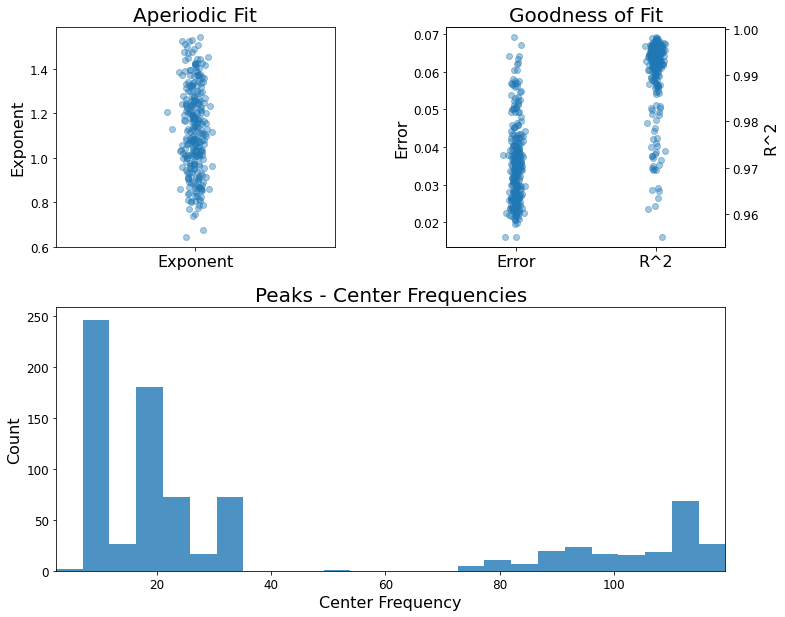

...

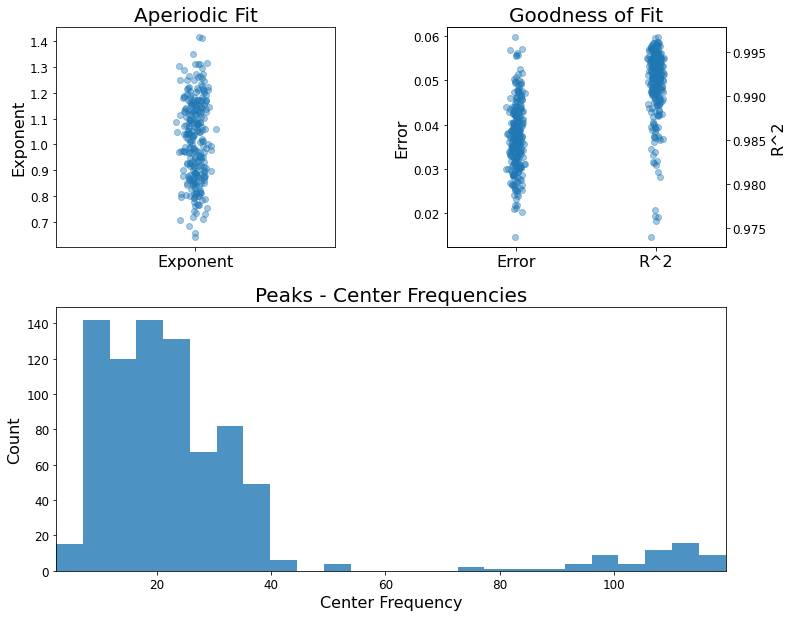

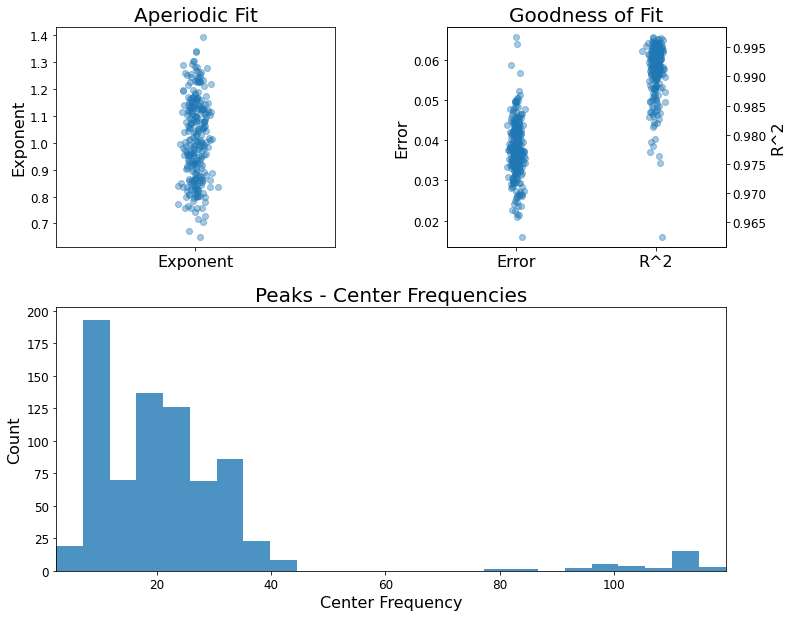

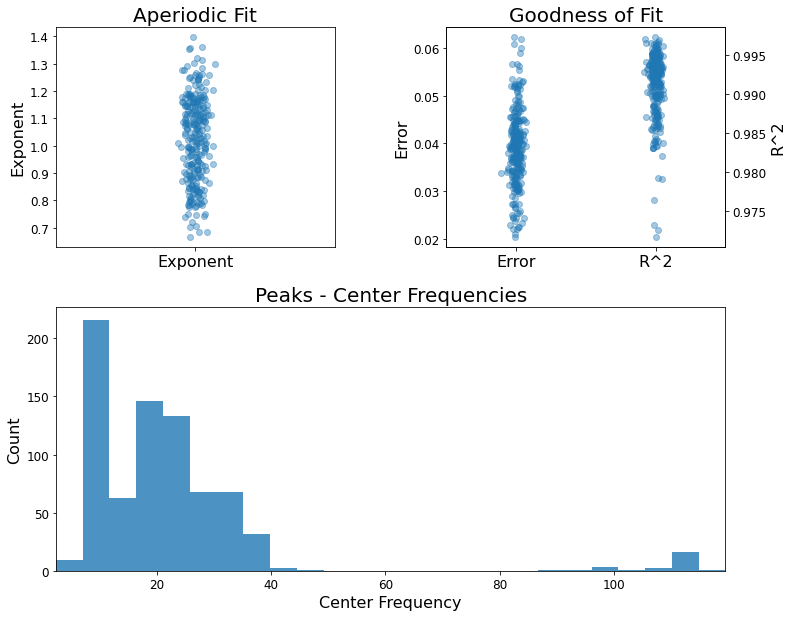

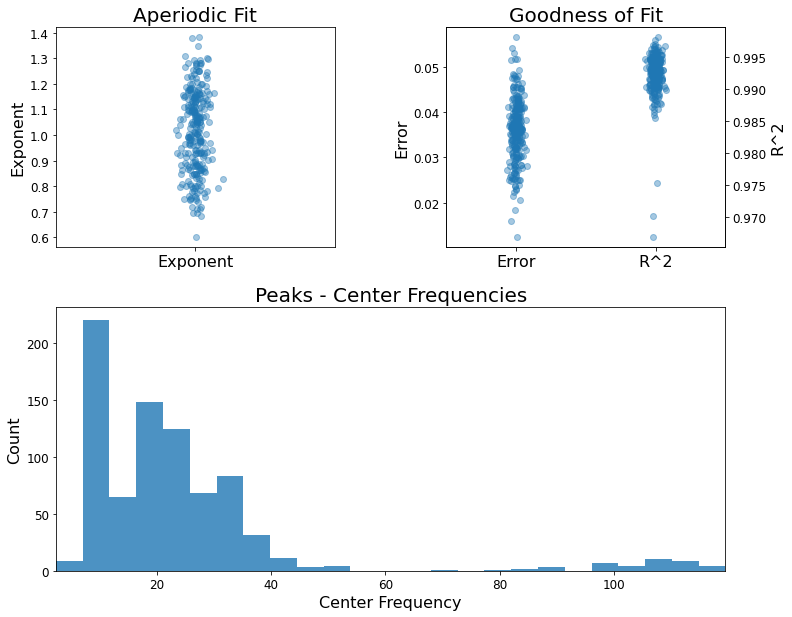

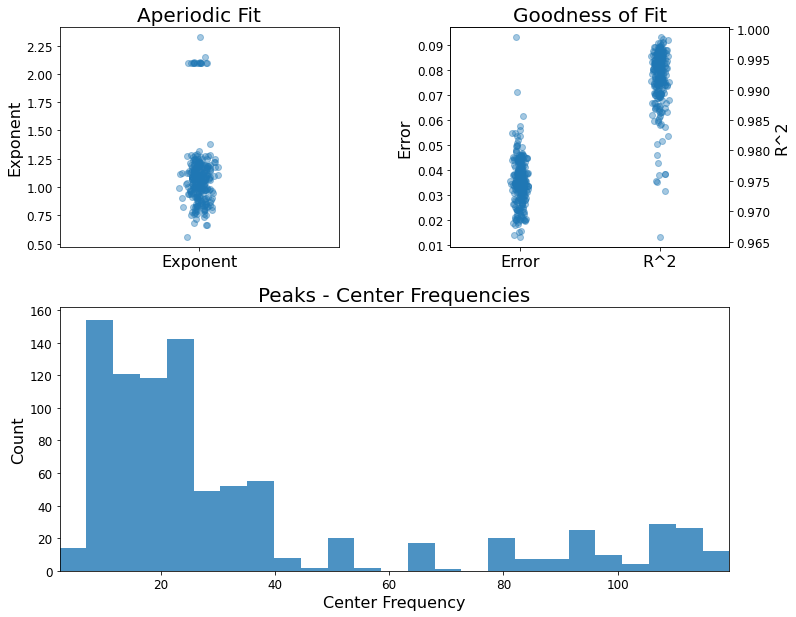

In [33]:
subj_id=[101,124,134,145]
for subj_id in subj_id:
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'   % (subj_id, subj_id, session))
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        mean_psds=np.mean(psds,axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        idx +=1
        fg.plot()
        plt.savefig((r'C:\Users\ytaza\Desktop\fit_r2_motor\'motor_fit'+str(idx)+'.png'),facecolor='w')

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-005-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-007-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-008-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-004-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-005-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-007-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-008-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-004-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-005-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
55 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-007-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
55 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-008-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
55 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-004-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-005-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\plts\fg.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=PLT_FIGSIZES['group'])
C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-007-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-008-visual-epo.fif ...


C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.



C:\Users\ytaza\anaconda3\envs\single_subject_MEG\lib\site-packages\fooof\objs\group.py:378: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out = np.array([np.insert(getattr(data, name), 3, index, axis=1)


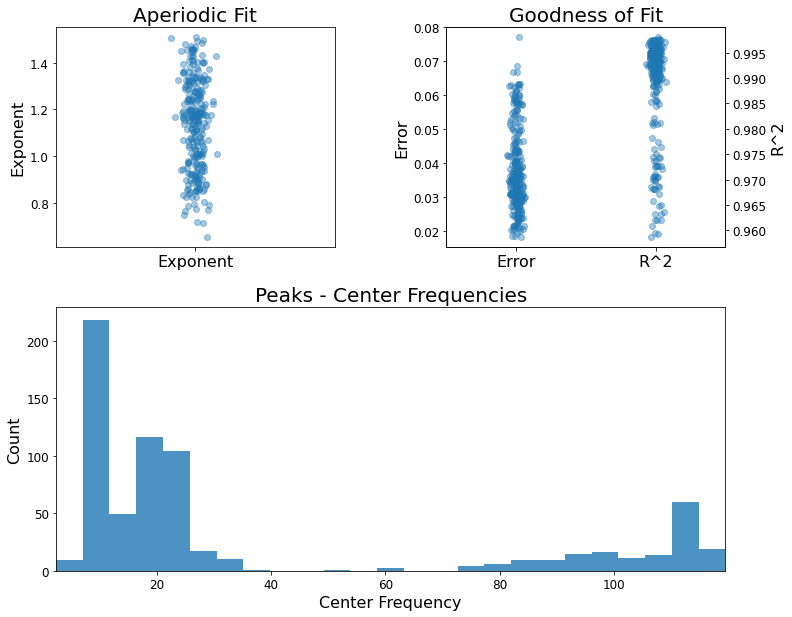

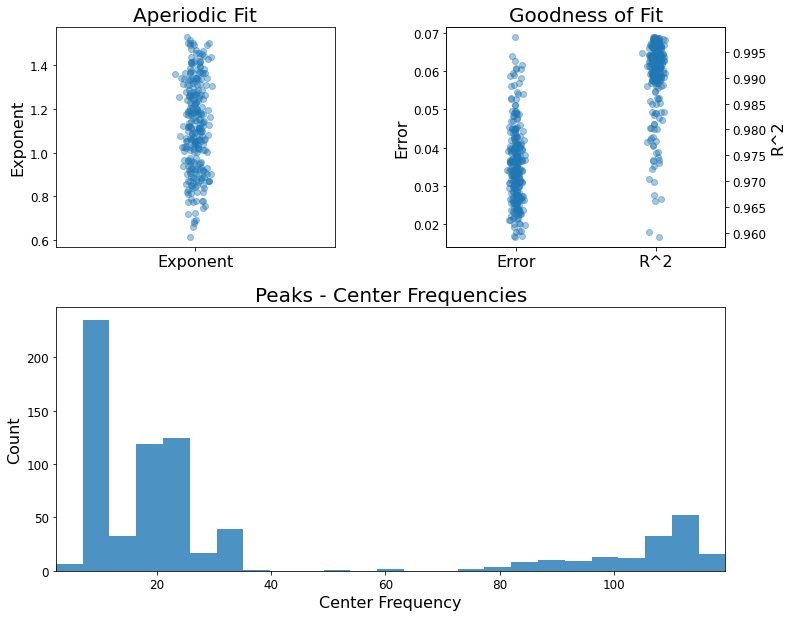

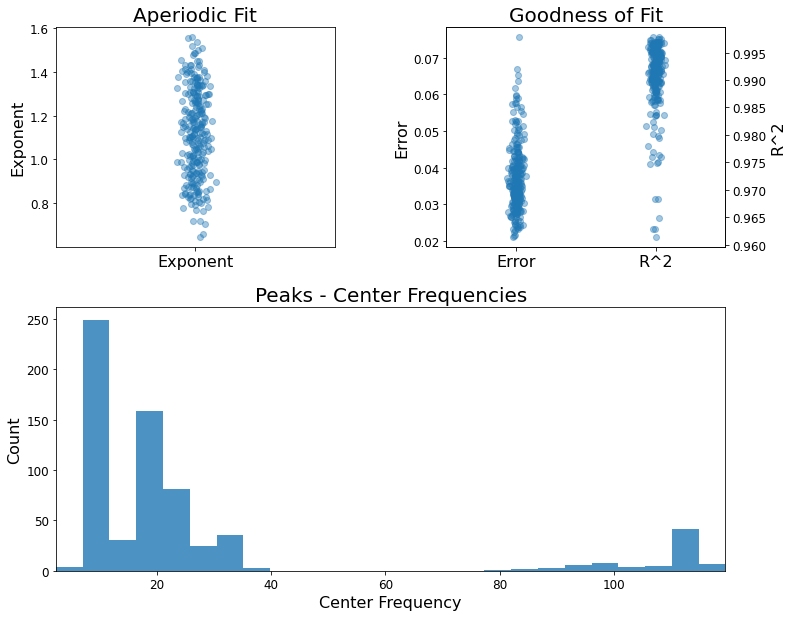

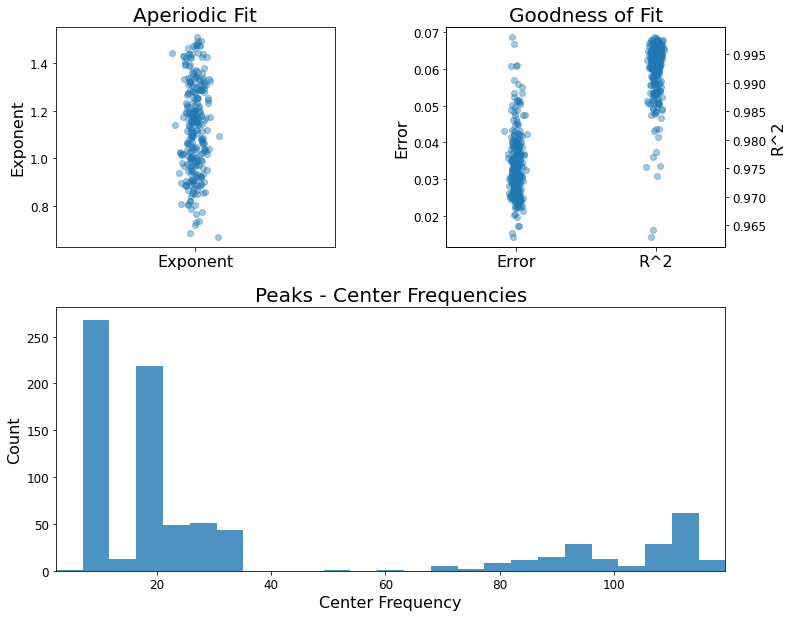

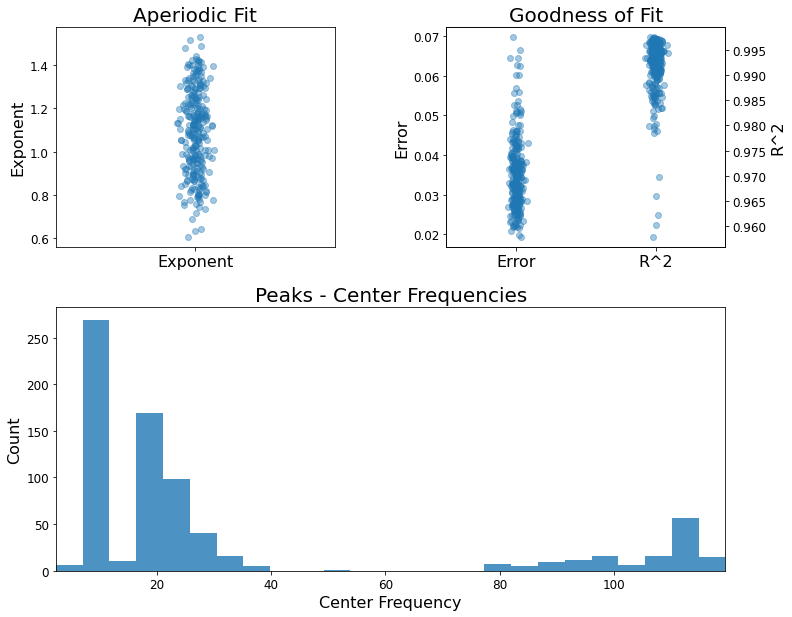

...

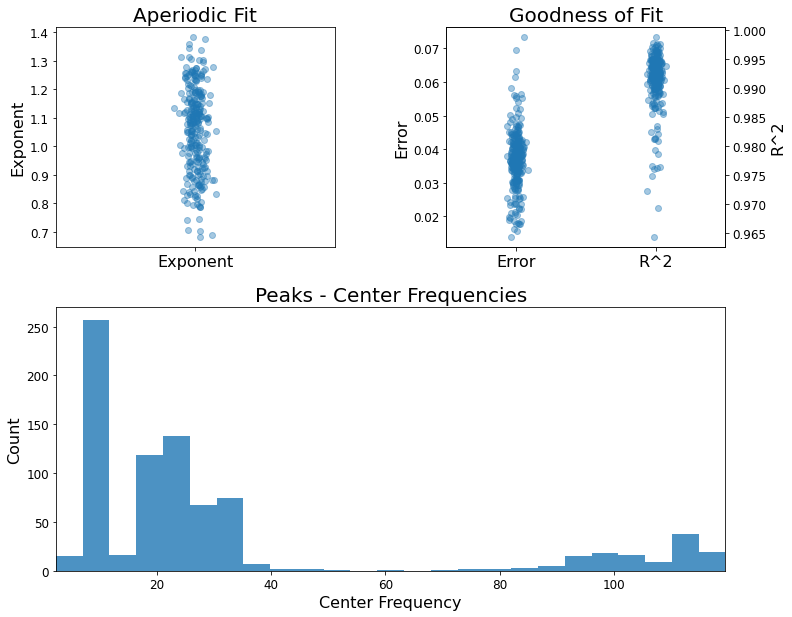

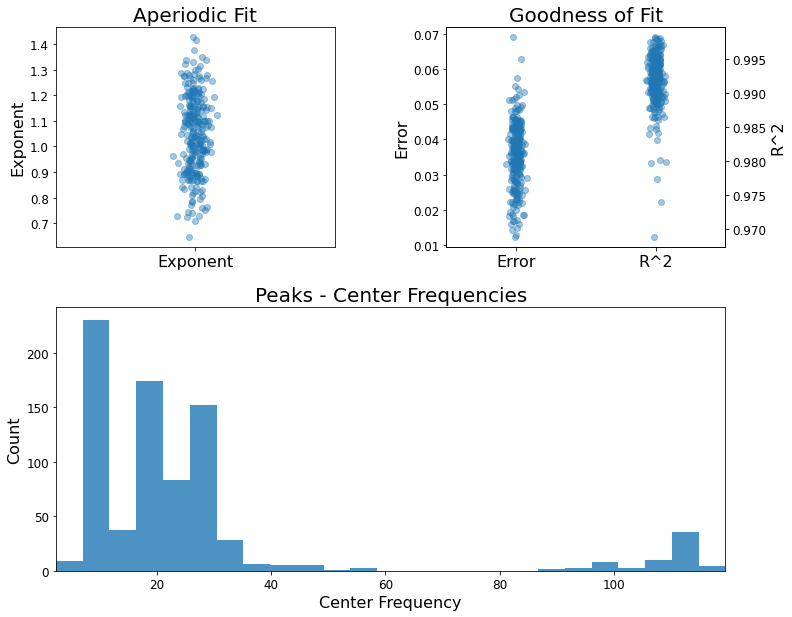

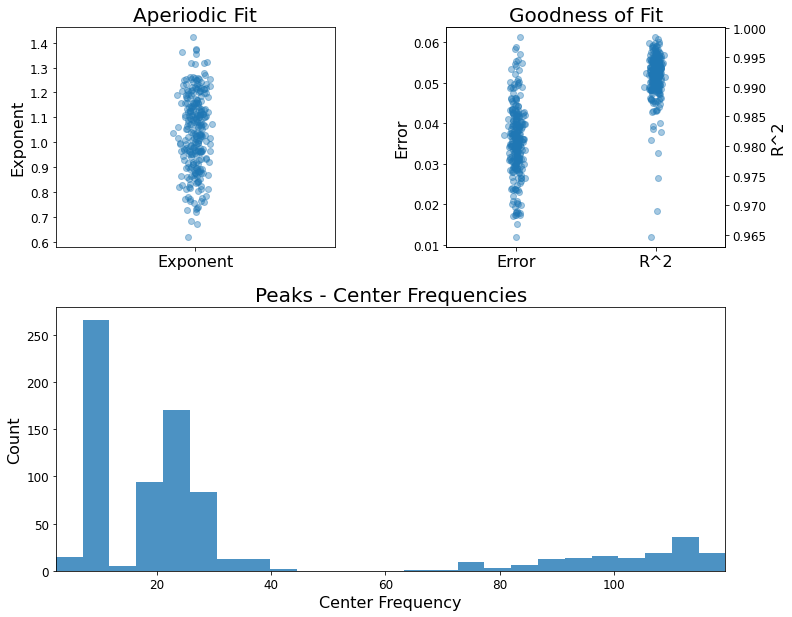

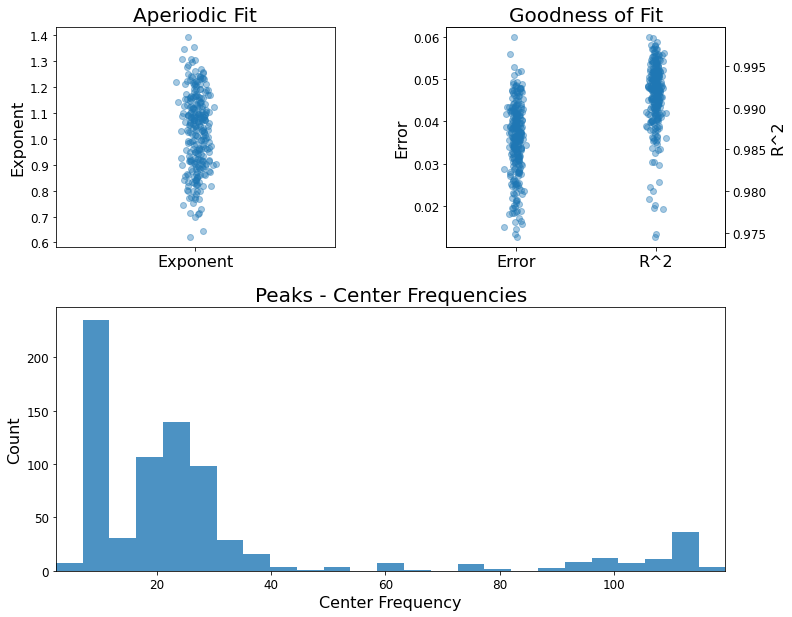

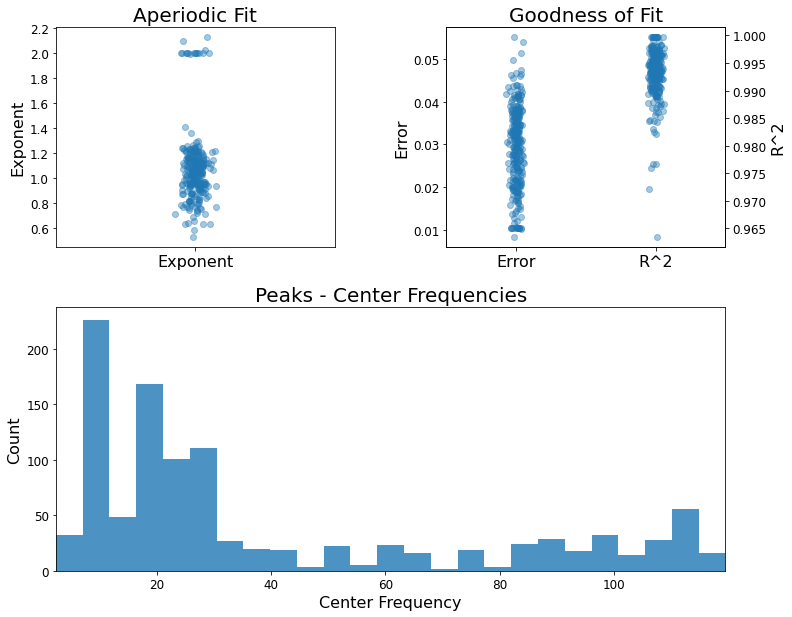

In [32]:
subj_id=[101,124,134,145]
for subj_id in subj_id:
    for session in range(3,9):
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'   % (subj_id, subj_id, session))
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        psds,freqs= mne.time_frequency.psd_welch(epochs,fmin=0,fmax=120)
        mean_psds=np.mean(psds,axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        fg.plot()
        idx +=1
        plt.savefig((r'C:\Users\ytaza\Desktop\fit_r2_visual\'fit'+str(idx)+'.png'),facecolor='w')

In [4]:
#dividing the epochs before/after reach need to adjust for R^2, I could do after 

In [7]:
aft_motor_perturb_coh=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                aft_epochs=epochs.copy().crop(tmin=0, tmax=1.5, include_tmax=True)
                psds,freqs= mne.time_frequency.psd_welch(aft_epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    aft_motor_perturb_coh.append(perturb_list)
aft_motor_perturb_coh=np.array(aft_motor_perturb_coh)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [8]:
aft_motor_zero_inter=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        aft_epochs = epochs.copy().crop(tmin=0, tmax=1.5, include_tmax=True)
        psds,freqs= mne.time_frequency.psd_welch(aft_epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    aft_motor_zero_inter.append(session_params)
aft_motor_zero_inter=np.array(aft_motor_zero_inter)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [9]:
aftmean=np.nanmean(aft_motor_perturb_coh,axis=(0,3))
aftzmean=np.nanmean(aft_motor_zero_inter,axis=(0,1))

In [10]:
M30low=aftmean[0,0,:]
M30med=aftmean[0,1,:]
M30high=aftmean[0,2,:]
P30low=aftmean[1,0,:]
P30med=aftmean[1,1,:]
P30high=aftmean[1,2,:]
Nm30l_z=np.subtract(M30low,aftzmean)                    
Nm30m_z=np.subtract(M30med,aftzmean)        
Nm30h_z=np.subtract(M30high,aftzmean)        
Np30l_z=np.subtract(P30low,aftzmean)
Np30m_z=np.subtract(P30med,aftzmean)       
Np30h_z=np.subtract(P30high,aftzmean)
V=np.concatenate((Nm30l_z,Nm30m_z,Nm30h_z,Np30l_z,Np30m_z,Np30h_z))

Text(0.5, 1.0, 'slope')

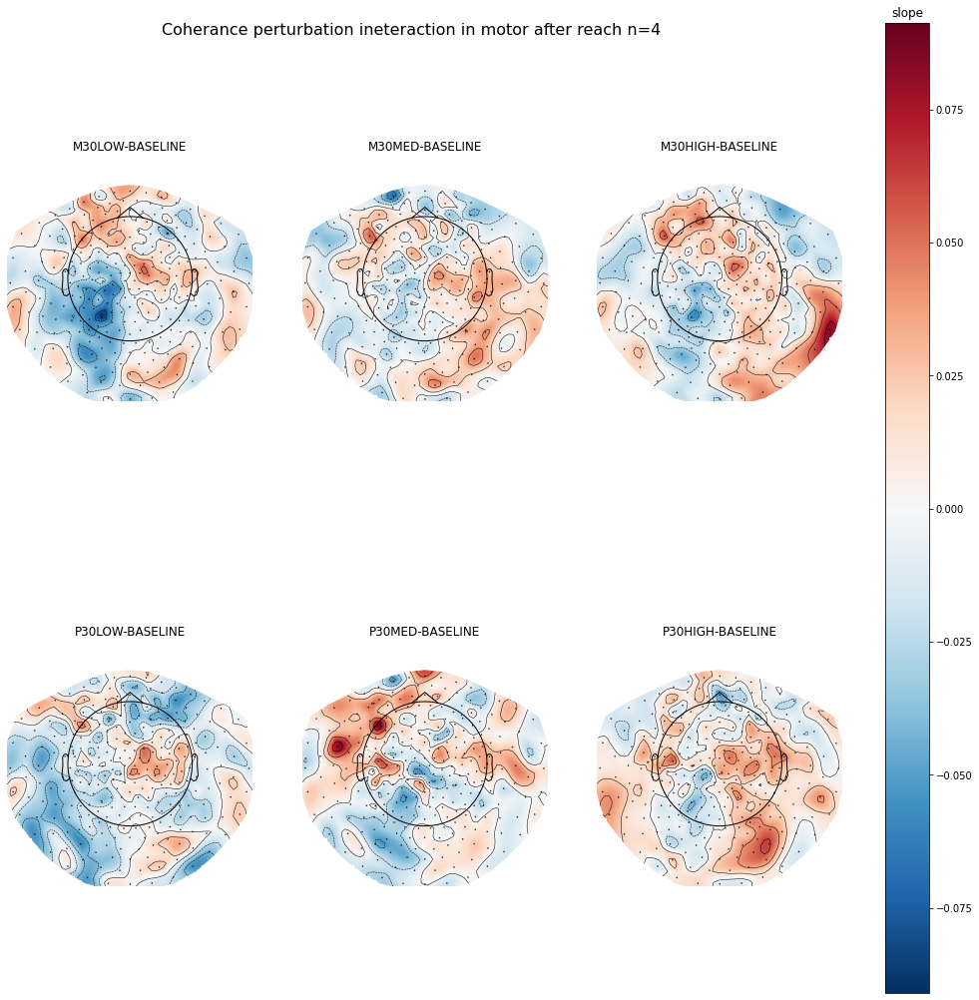

In [11]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Coherance perturbation ineteraction in motor after reach n=4',fontsize=16,y=1)

im,cm =plot_topomap(Nm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Nm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Nm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Np30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Np30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm =plot_topomap(Np30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [12]:
bef_motor_zero_inter=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        bef_epochs = epochs.copy().crop(tmin=-1, tmax=0, include_tmax=True)
        psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    bef_motor_zero_inter.append(session_params)
bef_motor_zero_inter=np.array(bef_motor_zero_inter)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [13]:
bef_motor_perturb_coh=[]
subj_id=[101,124,134,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-motor-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                bef_epochs=epochs.copy().crop(tmin=-1, tmax=0, include_tmax=True)
                psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    bef_motor_perturb_coh.append(perturb_list)
bef_motor_perturb_coh=np.array(bef_motor_perturb_coh)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-006-motor-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    1500.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\sub

In [14]:
befmean=np.nanmean(bef_motor_perturb_coh,axis=(0,3))
befzmean=np.nanmean(bef_motor_zero_inter,axis=(0,1))

In [15]:
M30low=befmean[0,0,:]
M30med=befmean[0,1,:]
M30high=befmean[0,2,:]
P30low=befmean[1,0,:]
P30med=befmean[1,1,:]
P30high=befmean[1,2,:]
Nm30l_z=np.subtract(M30low,befzmean)                    
Nm30m_z=np.subtract(M30med,befzmean)        
Nm30h_z=np.subtract(M30high,befzmean)        
Np30l_z=np.subtract(P30low,befzmean)
Np30m_z=np.subtract(P30med,befzmean)       
Np30h_z=np.subtract(P30high,befzmean)
V=np.concatenate((Nm30l_z,Nm30m_z,Nm30h_z,Np30l_z,Np30m_z,Np30h_z))

Text(0.5, 1.0, 'slope')

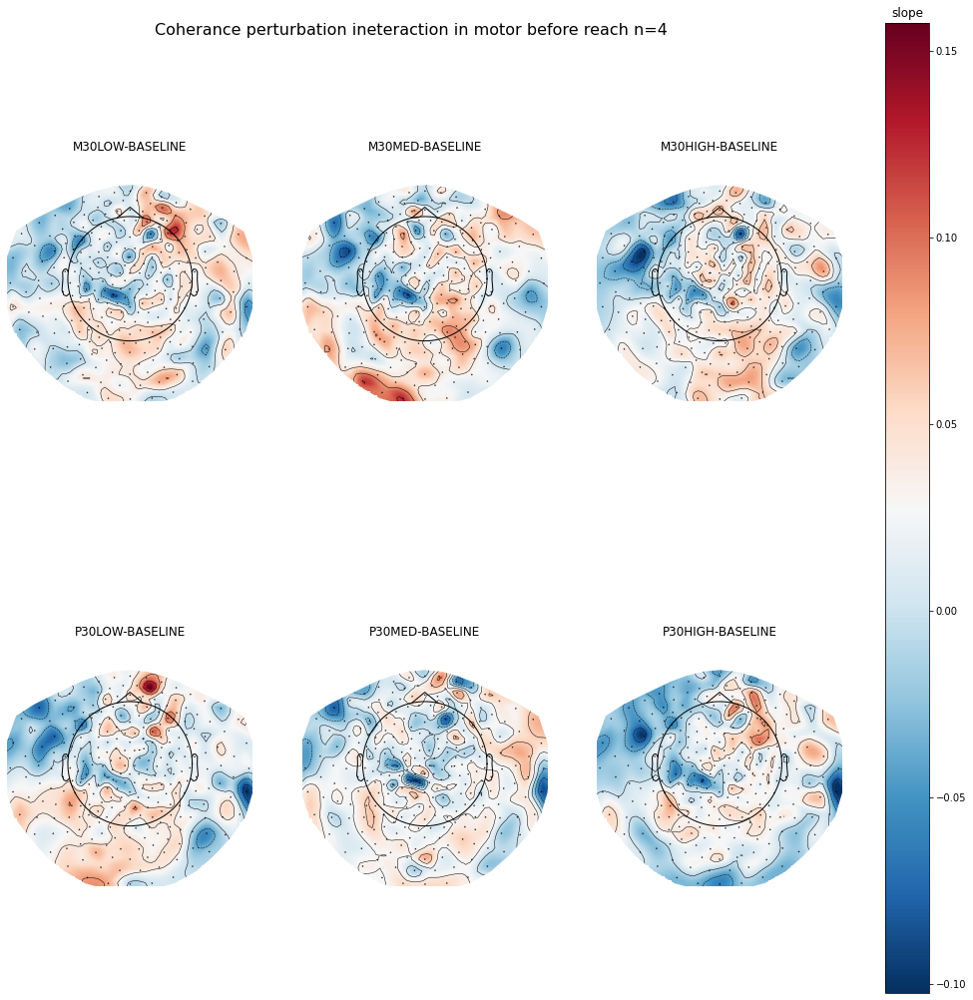

In [16]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Coherance perturbation ineteraction in motor before reach n=4',fontsize=16,y=1)

im,cm =plot_topomap(Nm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Nm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Nm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Np30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Np30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm =plot_topomap(Np30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [32]:
bef_visual_zero_inter=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        bef_epochs = epochs.copy().crop(tmin=-1, tmax=0, include_tmax=True)
        psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    bef_visual_zero_inter.append(session_params)
bef_visual_zero_inter=np.array(bef_visual_zero_inter)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

In [33]:
bef_visual_perturb_coh=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                bef_epochs=epochs.copy().crop(tmin=-1, tmax=0, include_tmax=True)
                psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    bef_visual_perturb_coh.append(perturb_list)
bef_visual_perturb_coh=np.array(bef_visual_perturb_coh)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\su

IndexError: index 55 is out of bounds for axis 0 with size 55

In [34]:
befmean=np.nanmean(bef_visual_perturb_coh,axis=(0,3))
befzmean=np.nanmean(bef_visual_zero_inter,axis=(0,1))

In [35]:
M30low=befmean[0,0,:]
M30med=befmean[0,1,:]
M30high=befmean[0,2,:]
P30low=befmean[1,0,:]
P30med=befmean[1,1,:]
P30high=befmean[1,2,:]
Nm30l_z=np.subtract(M30low,befzmean)                    
Nm30m_z=np.subtract(M30med,befzmean)        
Nm30h_z=np.subtract(M30high,befzmean)        
Np30l_z=np.subtract(P30low,befzmean)
Np30m_z=np.subtract(P30med,befzmean)       
Np30h_z=np.subtract(P30high,befzmean)
V=np.concatenate((Nm30l_z,Nm30m_z,Nm30h_z,Np30l_z,Np30m_z,Np30h_z))

Text(0.5, 1.0, 'slope')

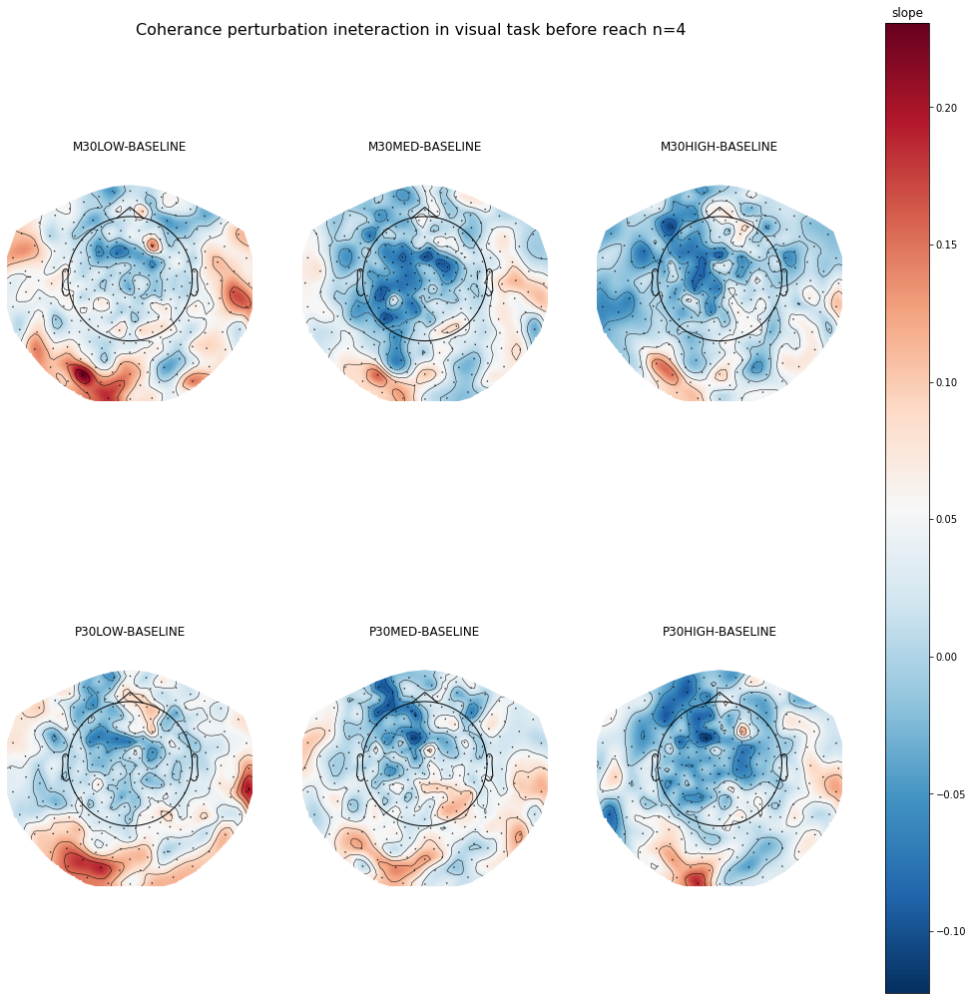

In [36]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Coherance perturbation ineteraction in visual  before reach n=4',fontsize=16,y=1)

im,cm =plot_topomap(Nm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Nm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Nm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Np30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Np30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm =plot_topomap(Np30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')

In [23]:
aft_visual_zero_inter=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    session_params=[]
    for session in range(3,9):     
        df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
        epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))  
        epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
        bef_epochs = epochs.copy().crop(tmin=0, tmax=2, include_tmax=True)
        psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
        idx=df[(df['perturb_cat'] == 0) & (df['coh_cat'] == 'zero')].index.values
        mean_psds=np.mean(psds[idx,:,:],axis=0)
        fg = FOOOFGroup()
        fg.fit(freqs, mean_psds)
        r2s = fg.get_params('r_squared')
        idxr2 = np.where(r2s<0.95)
        exp =fg.get_params('aperiodic_params', 'exponent')
        exp=np.array(exp)
        exp[idxr2]=np.nan
        session_params.append(exp)   
    aft_visual_zero_inter.append(session_params)
aft_visual_zero_inter=np.array(bef_visual_zero_inter)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-145\sub-145-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-145\su

In [24]:
aft_visual_perturb_coh=[]
subj_id=[101,124,145]
for subj_id in subj_id:
    cats=['low','med','high']
    Perturbs = {-30.0,30.0}
    perturb_list=[]
    for perturb in Perturbs:
        cat_list=[]
        for cat in cats:
            session_params=[]
            for session in range(3,9):
                df=pd.read_csv(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-beh.csv'   % (subj_id, subj_id, session))
                epochs=mne.read_epochs(r'C:\Users\ytaza\Desktop\export\sub-%d\sub-%d-00%d-visual-epo.fif'  % (subj_id, subj_id, session))
                epochs=epochs.pick_types(meg=True, ref_meg=False,misc=False)
                bef_epochs=epochs.copy().crop(tmin=-1, tmax=0, include_tmax=True)
                psds,freqs= mne.time_frequency.psd_welch(bef_epochs,fmin=0,fmax=120)
                idx=df[(df['perturb_cat'] == perturb) & (df['coh_cat'] == cat)].index.values
                mean_psds=np.mean(psds[idx,:,:],axis=0)
                fg = FOOOFGroup()
                fg.fit(freqs, mean_psds)
                r2s = fg.get_params('r_squared')
                idxr2 = np.where(r2s<0.95)
                exp =fg.get_params('aperiodic_params', 'exponent')
                exp=np.array(exp)
                exp[idxr2]=np.nan
                session_params.append(exp)
            cat_list.append(session_params)   
        perturb_list.append(cat_list)
    aft_visual_perturb_coh.append(perturb_list)
aft_visual_perturb_coh=np.array(aft_visual_perturb_coh)

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-101\sub-101-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-101\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-124\sub-124-006-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-124\su

Reading C:\Users\ytaza\Desktop\export\sub-134\sub-134-003-visual-epo.fif ...
    Read 5 compensation matrices
    Found the data of interest:
        t =   -1000.00 ...    2000.00 ms
        5 CTF compensation matrices available
0 bad epochs dropped
Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 0.427 (s)

FOOOF WARNING: Skipping frequency == 0, as this causes a problem with fitting.
Running FOOOFGroup across 274 power spectra.

FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 2.34 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Reading C:\Users\ytaza\Desktop\export\sub-134\su

IndexError: index 55 is out of bounds for axis 0 with size 55

In [25]:
aftmean=np.nanmean(aft_visual_perturb_coh,axis=(0,3))
aftzmean=np.nanmean(aft_visual_zero_inter,axis=(0,1))

In [26]:
M30low=aftmean[0,0,:]
M30med=aftmean[0,1,:]
M30high=aftmean[0,2,:]
P30low=aftmean[1,0,:]
P30med=aftmean[1,1,:]
P30high=aftmean[1,2,:]
Nm30l_z=np.subtract(M30low,aftzmean)                    
Nm30m_z=np.subtract(M30med,aftzmean)        
Nm30h_z=np.subtract(M30high,aftzmean)        
Np30l_z=np.subtract(P30low,aftzmean)
Np30m_z=np.subtract(P30med,aftzmean)       
Np30h_z=np.subtract(P30high,aftzmean)
V=np.concatenate((Nm30l_z,Nm30m_z,Nm30h_z,Np30l_z,Np30m_z,Np30h_z))

Text(0.5, 1.0, 'slope')

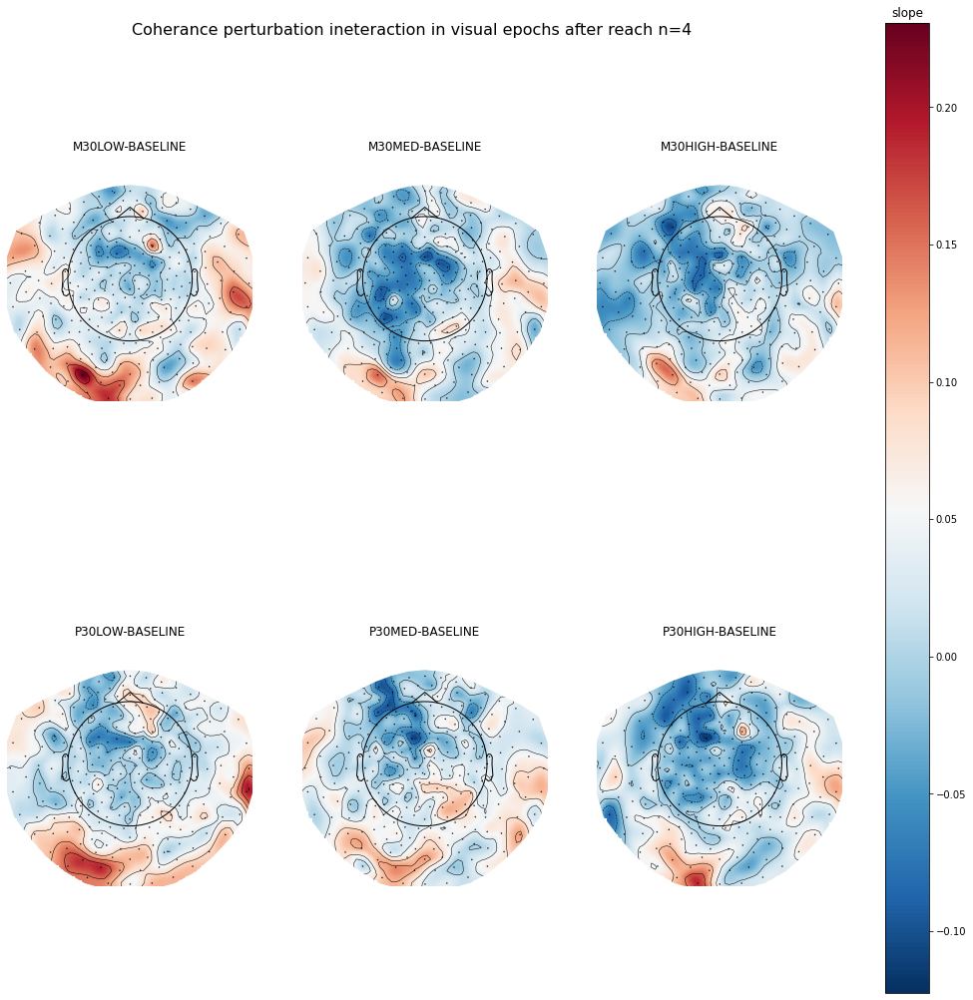

In [28]:
fig,[[ax1,ax2,ax3],[ax4,ax5,ax6]]= plt.subplots(2,3, figsize=[15,15],facecolor="white", sharey=False, sharex=False)
fig.suptitle('Coherance perturbation ineteraction in visual epochs after reach n=4',fontsize=16,y=1)

im,cm =plot_topomap(Nm30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax1,vmax=np.max(V),vmin=np.min(V))
ax1.set(title="M30LOW-BASELINE")

im,cm =plot_topomap(Nm30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax2,vmax=np.max(V),vmin=np.min(V))
ax2.set(title="M30MED-BASELINE")

im,cm =plot_topomap(Nm30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax3,vmax=np.max(V),vmin=np.min(V))
ax3.set(title="M30HIGH-BASELINE")

im,cm =plot_topomap(Np30l_z,epochs.info,cmap="RdBu_r",show=False, axes=ax4,vmax=np.max(V),vmin=np.min(V))
ax4.set(title="P30LOW-BASELINE")

im,cm =plot_topomap(Np30m_z, epochs.info, cmap="RdBu_r",show=False, axes=ax5,vmax=np.max(V),vmin=np.min(V))
ax5.set(title="P30MED-BASELINE")

im,cm =plot_topomap(Np30h_z,epochs.info,cmap="RdBu_r",show=False, axes=ax6,vmax=np.max(V),vmin=np.min(V))
ax6.set(title="P30HIGH-BASELINE")

ax_x_start = 0.94
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
clb.ax.set_title('slope')